In [ ]:
#import all library required
import numpy as np
import pandas as pd
import tensorflow as tf
from keras import backend as K
from pathlib import Path
import matplotlib as mpl
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

mpl.style.use("seaborn-darkgrid")


In [ ]:
#import all keras library component 
from tensorflow.keras.layers import (
    Input,
    Conv2D, 
    MaxPool2D, 
    Dense, 
    BatchNormalization, 
    ReLU, 
    Dropout, 
    Flatten,
    Dropout,
    Concatenate,
    GlobalAvgPool2D
)

from tensorflow.keras.regularizers import L2

In [ ]:
from google.colab import files
files.upload()

Saving side_img_enrich.zip to side_img_enrich.zip


{'side_img_enrich.zip': b'PK\x03\x04\x14\x00\x00\x00\x08\x00Ho\x9aU\xcf\xeb\x86\x89\x8b\x89H\x00\xc6i\x1e\x01\x13\x00\x00\x00side_img_enrich.csv\xec|\xcb\x8e#\xb1\xae\xe4~\x80\xf9\x13/\xf4~\xac\xe7w\x06\xb8\xff\xbf\x9b$\x19\x94"U\xae\xee>sw\x17\x02\x8ae;\xfdR\x86\xa8`\x90b\xfa\xff\xfc\xd7\xff\xfd\\\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xd7\xae]\xbbv\xed\xda\xb5k\xff\xc3\xed\x7f\xff\xaf\x94\xc7\'\xe5\xf9\xb6\x12\x9e\xdb\xfaI\xb1<\xf6\xdc\x0f\xf9\x13g\xff\xc41?\xb1?\xd6\xda\'\xd6\xf0\x89\xe59V\xc5\x92=n\xcf\xebz}^\xf7\xd8\xcc\xcf\xfb\xda\xf3\xfe\xf4\xd8s\x1b&l\xd8\xf1 \xcfG\xd8\xf3\x

In [5]:
from google.colab import files
files.upload()

Saving mat_nghieng_pt_enrich.csv to mat_nghieng_pt_enrich.csv


{'mat_nghieng_pt_enrich.csv': b'1x,1y,2x,2y,3x,3y,4x,4y,5x,5y\r\n10,14,5,22,3,25,2,28,9,34\r\n86,8,90,16,93,20,93,24,86,28\r\n87,24,91,30,93,33,94,36,88,40\r\n12,11,5,21,3,24,1,28,7,36\r\n24,25,21,33,20,36,18,40,22,45\r\n84,27,87,34,89,37,90,41,86,47\r\n12,33,5,40,3,43,2,47,7,51\r\n12,37,6,43,4,46,2,50,8,55\r\n26,48,22,57,20,60,20,64,26,66\r\n25,48,21,56,19,59,18,62,25,66\r\n25,39,19,46,17,49,16,52,22,57\r\n24,39,19,46,17,49,16,53,23,57\r\n21,39,16,47,14,49,13,53,18,56\r\n17,40,12,47,11,49,10,53,15,57\r\n29,35,24,42,22,44,21,47,26,52\r\n28,36,23,43,21,45,20,48,25,52\r\n15,35,7,42,5,45,4,50,11,54\r\n17,33,9,39,7,42,6,47,13,52\r\n18,38,12,45,10,48,8,52,15,56\r\n18,37,12,43,10,46,9,50,14,55\r\n86,15,90,22,91,25,93,30,86,33\r\n14,12,10,19,8,22,7,26,12,31\r\n76,41,81,49,82,52,83,57,78,59\r\n76,41,81,49,82,52,83,57,78,59\r\n27,36,23,42,21,44,19,47,24,51\r\n24,35,20,42,18,44,17,47,23,50\r\n14,34,8,42,6,44,5,47,11,51\r\n12,36,7,43,5,45,3,48,9,53\r\n22,37,17,43,15,45,14,49,20,53\r\n21,38,16,44,

In [6]:
#read train data, and analysis
# df_train=pd.read_csv("train.csv")
df_train=pd.read_csv("mat_nghieng_pt_enrich.csv")

In [8]:
#read img data, and analysis
# df_img=pd.read_csv("Img.zip")
df_img=pd.read_csv("side_img_enrich.zip")
print(df_img)

     Col  Col.1  Col.2  Col.3  Col.4  Col.5  Col.6  Col.7  Col.8  Col.9  ...  \
0    238    239    239    239    239    240    235    214    210    203  ...   
1     58     54     54     50     38     35     31     37     47     38  ...   
2    244    244    244    244    244    244    244    244    243    243  ...   
3    252    252    252    252    252    252    252    252    252    253  ...   
4    251    251    251    251    251    251    251    251    251    251  ...   
..   ...    ...    ...    ...    ...    ...    ...    ...    ...    ...  ...   
595  157    158    158    159    159    159    160    160    160    161  ...   
596  161    161    162    164    164    165    165    166    166    167  ...   
597  187    188    188    189    189    189    190    191    190    190  ...   
598  202    202    202    202    203    203    203    204    205    205  ...   
599  209    208    207    207    207    207    207    208    208    208  ...   

     Col.9206  Col.9207  Col.9208  Col.

In [9]:
print(df_train)

     1x  1y  2x  2y  3x  3y  4x  4y  5x  5y
0    10  14   5  22   3  25   2  28   9  34
1    86   8  90  16  93  20  93  24  86  28
2    87  24  91  30  93  33  94  36  88  40
3    12  11   5  21   3  24   1  28   7  36
4    24  25  21  33  20  36  18  40  22  45
..   ..  ..  ..  ..  ..  ..  ..  ..  ..  ..
595  83  42  87  48  89  50  90  53  85  57
596  30  51  28  57  26  60  24  63  29  68
597  86  35  89  40  90  43  91  46  86  49
598  26  54  23  60  22  63  22  66  26  70
599  74  23  78  32  80  35  81  38  76  44

[600 rows x 10 columns]


In [10]:
df_img['Image'] = df_img[df_img.columns[0:]].apply(lambda x: ' '.join(x.dropna().astype(str)),axis=1)
print("Modified DataFrame:\n",df_img["Image"])
print(df_img.head())

Modified DataFrame:
 0      238 239 239 239 239 240 235 214 210 203 197 18...
1      58 54 54 50 38 35 31 37 47 38 44 47 34 107 214...
2      244 244 244 244 244 244 244 244 243 243 242 24...
3      252 252 252 252 252 252 252 252 252 253 253 22...
4      251 251 251 251 251 251 251 251 251 251 251 25...
                             ...                        
595    157 158 158 159 159 159 160 160 160 161 161 16...
596    161 161 162 164 164 165 165 166 166 167 167 16...
597    187 188 188 189 189 189 190 191 190 190 191 19...
598    202 202 202 202 203 203 203 204 205 205 206 20...
599    209 208 207 207 207 207 207 208 208 208 211 19...
Name: Image, Length: 600, dtype: object
   Col  Col.1  Col.2  Col.3  Col.4  Col.5  Col.6  Col.7  Col.8  Col.9  ...  \
0  238    239    239    239    239    240    235    214    210    203  ...   
1   58     54     54     50     38     35     31     37     47     38  ...   
2  244    244    244    244    244    244    244    244    243    243  ...   


In [11]:
df_img.head(1)

,Col,Col.1,Col.2,Col.3,Col.4,Col.5,Col.6,Col.7,Col.8,Col.9,...,Col.9207,Col.9208,Col.9209,Col.9210,Col.9211,Col.9212,Col.9213,Col.9214,Col.9215,Image
0,238,239,239,239,239,240,235,214,210,203,...,47,45,47,45,47,46,46,45,47,238 239 239 239 239 240 235 214 210 203 197 18...


In [ ]:
# images=np.array(df_img['Image'].str.split().tolist(), dtype="float").reshape(-1,96,96,1)
# print(images)

In [12]:
df_train.head(3)
#dataset consist of 30 feature (x and y coordinate ) and image array

,1x,1y,2x,2y,3x,3y,4x,4y,5x,5y
0,10,14,5,22,3,25,2,28,9,34
1,86,8,90,16,93,20,93,24,86,28
2,87,24,91,30,93,33,94,36,88,40


In [13]:
# define feature and target columns
# 
# feature_col,target_col="Image",list(df_train.drop("Image",axis=1).columns)
feature_col,target_col="Image",list(df_train.columns)

In [14]:
# replace NaN with mean  
# if found Nan replace
# df_train[target_col] = df_train[target_col].fillna(df_train[target_col].mean())
df_train.info()
print(df_train)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 600 entries, 0 to 599
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   1x      600 non-null    int64
 1   1y      600 non-null    int64
 2   2x      600 non-null    int64
 3   2y      600 non-null    int64
 4   3x      600 non-null    int64
 5   3y      600 non-null    int64
 6   4x      600 non-null    int64
 7   4y      600 non-null    int64
 8   5x      600 non-null    int64
 9   5y      600 non-null    int64
dtypes: int64(10)
memory usage: 47.0 KB
     1x  1y  2x  2y  3x  3y  4x  4y  5x  5y
0    10  14   5  22   3  25   2  28   9  34
1    86   8  90  16  93  20  93  24  86  28
2    87  24  91  30  93  33  94  36  88  40
3    12  11   5  21   3  24   1  28   7  36
4    24  25  21  33  20  36  18  40  22  45
..   ..  ..  ..  ..  ..  ..  ..  ..  ..  ..
595  83  42  87  48  89  50  90  53  85  57
596  30  51  28  57  26  60  24  63  29  68
597  86  35  89  40  90  43  91  46  86

In [15]:
target_col # total 30 target (x,y coordinate)

['1x', '1y', '2x', '2y', '3x', '3y', '4x', '4y', '5x', '5y']

In [16]:
# define width and height of image
IMG_WIDTH=96
IMG_HEIGHT=96
IMG_CANNELS=1 # grayscale image
## split image and label  #image
images=np.array(df_img[feature_col].str.split().tolist(),dtype="float").reshape(-1,IMG_HEIGHT,IMG_WIDTH,IMG_CANNELS)
print(images)
labels=df_train[target_col].to_numpy()

[[[[238.]
   [239.]
   [239.]
   ...
   [ 36.]
   [ 34.]
   [ 24.]]

  [[239.]
   [239.]
   [239.]
   ...
   [ 37.]
   [ 34.]
   [ 29.]]

  [[239.]
   [239.]
   [239.]
   ...
   [ 36.]
   [ 36.]
   [ 33.]]

  ...

  [[230.]
   [229.]
   [229.]
   ...
   [ 45.]
   [ 45.]
   [ 48.]]

  [[229.]
   [229.]
   [228.]
   ...
   [ 47.]
   [ 45.]
   [ 45.]]

  [[229.]
   [228.]
   [228.]
   ...
   [ 46.]
   [ 45.]
   [ 47.]]]


 [[[ 58.]
   [ 54.]
   [ 54.]
   ...
   [241.]
   [241.]
   [241.]]

  [[ 55.]
   [ 56.]
   [ 53.]
   ...
   [241.]
   [241.]
   [241.]]

  [[ 61.]
   [ 54.]
   [ 46.]
   ...
   [241.]
   [241.]
   [241.]]

  ...

  [[ 62.]
   [ 60.]
   [ 61.]
   ...
   [219.]
   [220.]
   [221.]]

  [[ 64.]
   [ 62.]
   [ 61.]
   ...
   [219.]
   [220.]
   [220.]]

  [[ 65.]
   [ 62.]
   [ 61.]
   ...
   [218.]
   [219.]
   [219.]]]


 [[[244.]
   [244.]
   [244.]
   ...
   [242.]
   [245.]
   [244.]]

  [[244.]
   [244.]
   [244.]
   ...
   [243.]
   [244.]
   [244.]]

  [[244.]
   [24

In [17]:
print(images[0].shape)
# scale image from 0 -255 to 0-1 for better training
scaled_images=images/255.0

(96, 96, 1)


In [18]:
print(labels)
print(labels.shape)

[[10 14  5 ... 28  9 34]
 [86  8 90 ... 24 86 28]
 [87 24 91 ... 36 88 40]
 ...
 [86 35 89 ... 46 86 49]
 [26 54 23 ... 66 26 70]
 [74 23 78 ... 38 76 44]]
(600, 10)


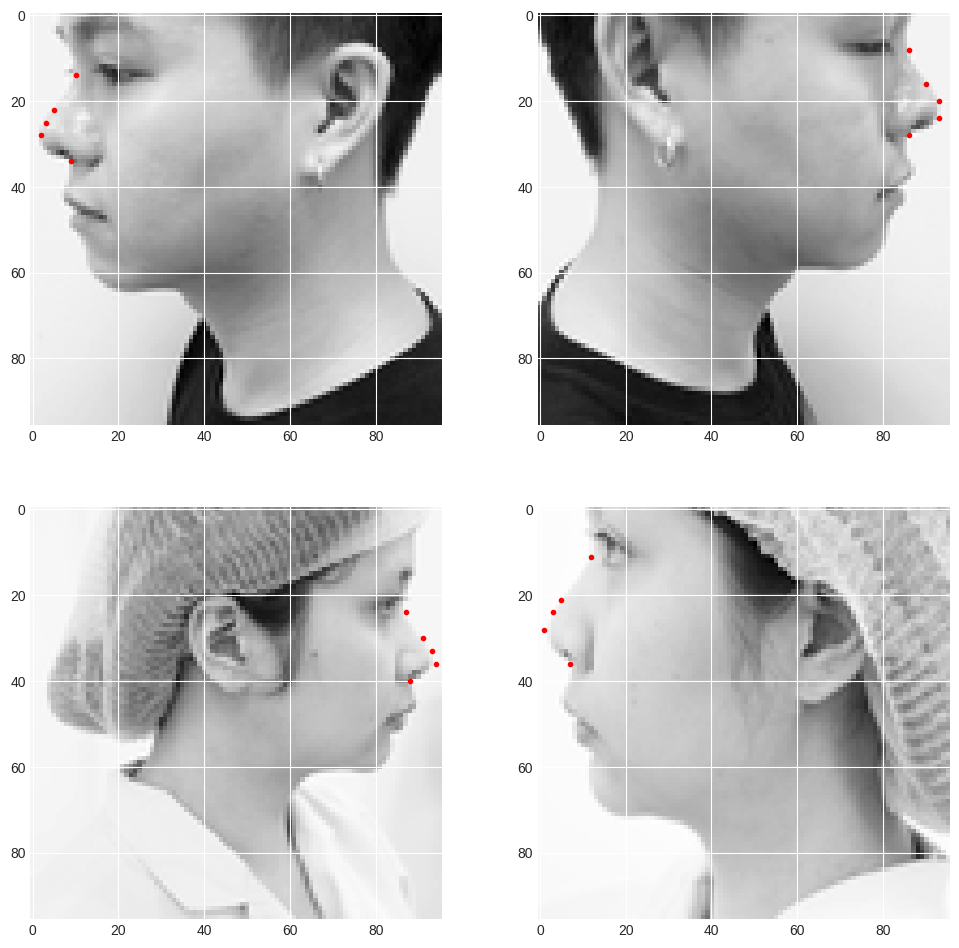

In [21]:
# Show img and key points. SHOW multil imgage
# df_train=pd.read_csv("train.csv")
# df_train=pd.read_csv("mat_truoc.csv")
df_train.head()
fig, ax = plt.subplots(2,2,figsize = (12,12), dpi = 100)
axes = ax.ravel()
for idx,ax  in enumerate(axes):
    ax.imshow(images[idx].reshape(96,96),cmap='gray')
    photo_visualize_pnts = df_train.iloc[idx].values
    ax.scatter(photo_visualize_pnts[0::2], photo_visualize_pnts[1::2], c='Red', marker='.')
fig.show()


In [22]:
# spliting training dataset for training and validation
train_images,valid_images,train_labels,valid_labels=train_test_split(scaled_images,labels,test_size=0.1,random_state=7)
train_images,test_images,train_labels,test_labels=train_test_split(train_images,train_labels,test_size=0.1,random_state=7)
# 10 % of data is for validation and test
# 90 % of data is for traiing 
# shuffle dataset before spliting with randam state of 7


In [33]:
print(" số lượng train img là: ", train_images.shape[0])
print(" số lượng test img là: ",test_images.shape[0])
print(" số lượng valid là: ",valid_images.shape[0])

 số lượng train img là:  486
 số lượng test img là:  54
 số lượng valid là:  60


In [49]:
# Let's start with model
# We will create CNN model that uses Inception Architecture
def inception_module(inputs,f1,f2):
    # defining convolution 2d layer 
    x1=Conv2D(f1,3,padding="same")(inputs)
    # batchnormalize the x1
    x1=BatchNormalization()(x1)
    x1=ReLU()(x1)   
    # it was f1 change it to f2 
    x2=Conv2D(f2,5,padding="same")(inputs)
    # batchnormalize the x1
    x2=BatchNormalization()(x2)
    x2=ReLU()(x2)
    # combine x1 and x2
    return Concatenate()([x1,x2])
    

In [50]:
def build_model():
    inputs = Input((96, 96, 1))
    x = inception_module(inputs, 64,  32)
    x = MaxPool2D()(x)
    x = inception_module(x, 64,  32)
    x = MaxPool2D()(x)
    x = inception_module(x, 128, 32)
    x = MaxPool2D()(x)
    x = inception_module(x, 128, 32)
    x = MaxPool2D()(x)
    x = inception_module(x, 256, 64)
    x = MaxPool2D()(x)
    x = Flatten()(x)
    x = Dense(1024, kernel_regularizer=L2(l2=0.05))(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Dense(512, kernel_regularizer=L2(l2=0.02))(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Dense(128, kernel_regularizer=L2(l2=0.01))(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    ## train wwith 5 points
    x = Dense(10)(x)
    
    model = tf.keras.Model(inputs, outputs=x)
    return model

model = build_model()
# model.summary()
from keras.utils.vis_utils import plot_model
# plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [51]:
#compile model 
# def custom_mean_squared_error(y_true, y_pred):
#     return tf.math.reduce_mean(tf.sqrt.square(y_true - y_pred))
# you can change this value to get better accuracy
model.compile(optimizer="adam",loss="mean_squared_error",metrics=["mae"])

In [52]:
# creating a chechpoint to save model at best accuarcy
ckp_path="trained_model/model"
model_checkpoint=tf.keras.callbacks.ModelCheckpoint(filepath=ckp_path,
                                                   monitor="val_mae",
                                                   mode="auto",
                                                   save_best_only=True,
                                                   save_weights_only=True)

In [53]:
# create a lr reducer which decrease learning rate when accuarcy does not increase
reduce_lr=tf.keras.callbacks.ReduceLROnPlateau(factor=0.9,monitor="val_mae",
                                             mode="auto",cooldown=0,
                                             patience=10,verbose=1,min_lr=1e-10)
# patience : wait till 5 epoch
# verbose : show accuracy every 1 epoch
# min_lr=minimum learning rate
#

In [54]:
print(train_labels)
print(train_labels.shape)

[[74 37 79 ... 52 78 56]
 [10 14  5 ... 28  9 34]
 [25 48 21 ... 62 25 66]
 ...
 [81 32 86 ... 49 81 56]
 [75 26 79 ... 41 77 46]
 [78 16 83 ... 34 79 39]]
(486, 10)


In [55]:
# Training model
EPOCHS= 900
BATCH_SIZE= 18
history=model.fit(train_images,
                 train_labels,
                 validation_data=(valid_images,valid_labels),
                 batch_size=BATCH_SIZE,
                 epochs=EPOCHS,
                 callbacks=[model_checkpoint,reduce_lr]
                 )
# found the error
# we are getting NaN value in training because there is NaN in train set

Epoch 1/900
27/27 [==============================] - 4s 52ms/step - loss: 2691.5613 - mae: 45.3243 - val_loss: 2652.8823 - val_mae: 44.1875 - lr: 0.0010
Epoch 2/900
27/27 [==============================] - 1s 32ms/step - loss: 2479.5249 - mae: 43.4916 - val_loss: 2761.9509 - val_mae: 44.9488 - lr: 0.0010
Epoch 3/900
27/27 [==============================] - 37s 1s/step - loss: 2267.3784 - mae: 41.4625 - val_loss: 2530.2061 - val_mae: 43.0696 - lr: 0.0010
Epoch 4/900
27/27 [==============================] - 1s 40ms/step - loss: 2039.1356 - mae: 39.1353 - val_loss: 2413.5383 - val_mae: 41.1211 - lr: 0.0010
Epoch 5/900
27/27 [==============================] - 1s 38ms/step - loss: 1799.1058 - mae: 36.5887 - val_loss: 2048.7393 - val_mae: 38.6276 - lr: 0.0010
Epoch 6/900
27/27 [==============================] - 1s 38ms/step - loss: 1560.5305 - mae: 33.7893 - val_loss: 2036.6953 - val_mae: 37.5750 - lr: 0.0010
Epoch 7/900
27/27 [==============================] - 1s 40ms/step - loss: 1318.8085

In [56]:
# now  training is working properly

In [ ]:
# I will see you when training is finish

In [57]:
#now the training is finished load best model from check point
model.load_weights(ckp_path)

In [58]:
# now save the model in tflite formate
#converter that convert tf to tflite
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()
# Save the model.
with open('model.tflite', 'wb') as f:
  f.write(tflite_model)

In [71]:
# predict on test data
prediction_test_img=model.predict(test_images,batch_size=1)

54/54 [==============================] - 1s 3ms/step


In [72]:

print(prediction_test_img.shape)

(54, 10)


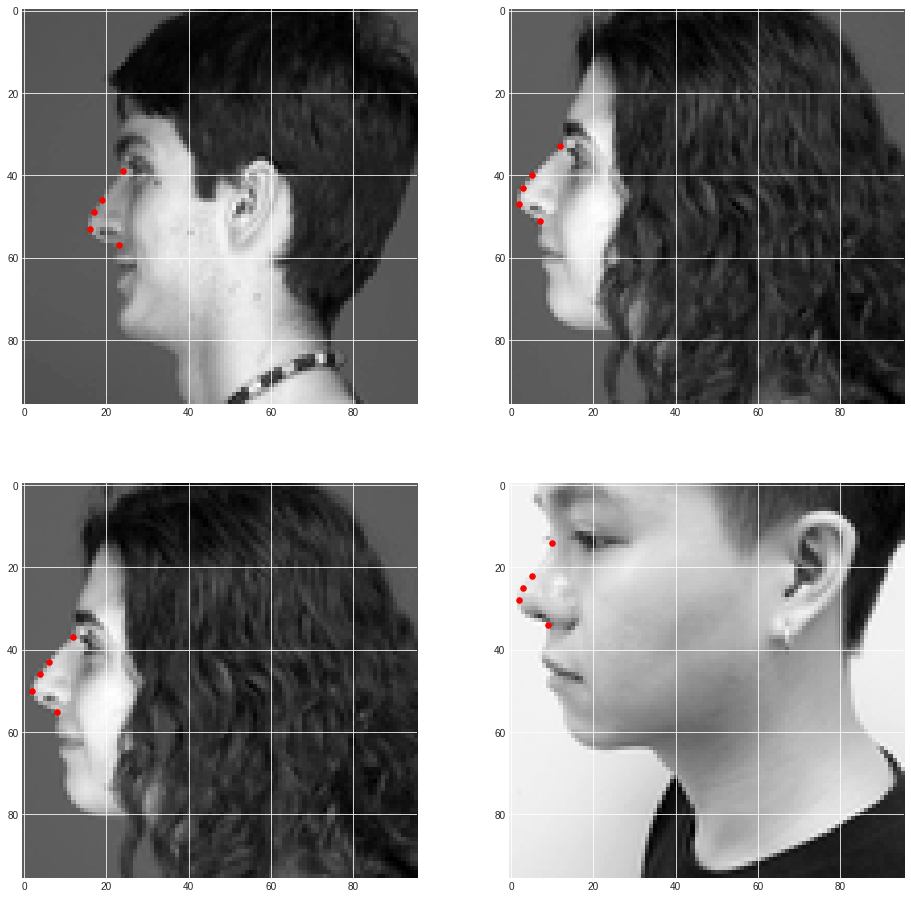

In [76]:
# let's make a function to show training dataset visual
def show_examples(images, landmarks):
  # make a figure consist of 16 images
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 16))
    # looping through each image
    for img, marks, ax in zip(images, landmarks, axes.ravel()):
        # Keypoints
        # every odd values are x coordinate
        # every even values are y coodinate
        x_points = marks[:: 2]
        y_points = marks[1::2]
        
        # display on figure 
        ax.imshow(img.squeeze(), cmap='gray')
        ax.scatter(x_points, y_points, s=30, color='red')
    
    plt.show()
    

idx = np.random.choice(16, 16)
show_examples(images[idx], labels[idx])

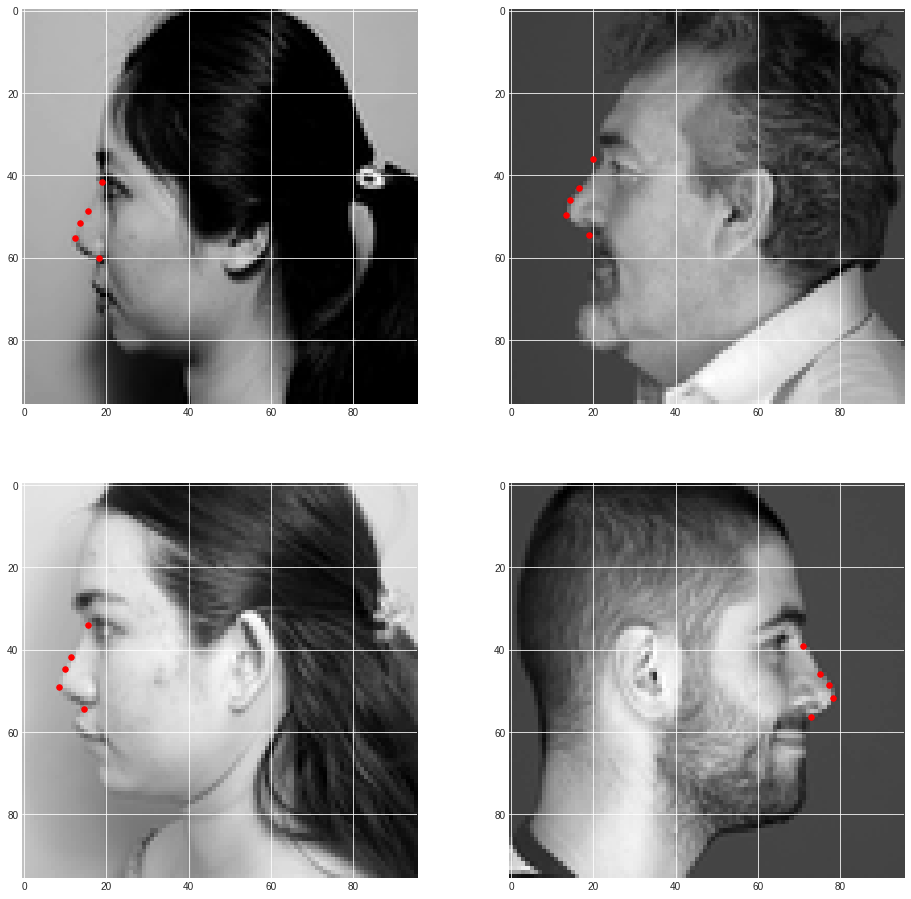

In [77]:
# Visualize test img spit from train data before train
idx=np.random.choice(16,16)
show_examples(test_images[idx]*255,prediction_test_img[idx])

In [ ]:
# perfect 
# now download model 
# or you can save version for future use
# download model after creating save is done 


In [ ]:
#Link of model and training will be in description 
# you can copy code from that link 
#